<a href="https://colab.research.google.com/github/GENTLEW1ND/Python/blob/main/Car_Connection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install opendatasets

In [2]:
import opendatasets as od
import numpy as np
import pandas as pd

In [3]:
od.download(
    "https://www.kaggle.com/datasets/prondeau/the-car-connection-picture-dataset"
)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: rajcby
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/prondeau/the-car-connection-picture-dataset


In [4]:
!ls

sample_data  the-car-connection-picture-dataset


In [5]:
import os

# Path to your dataset folder
dataset_path = "the-car-connection-picture-dataset"

# List all files and subdirectories
files = os.listdir(dataset_path)

print(files)

['GMC_Terrain_2011_26_17_180_24_4_72_66_185_20_AWD_5_4_SUV_fIz.jpg', 'Mercedes-Benz_GLC Class_2020_63_20_380_30_6_76_62_186_18_AWD_5_4_SUV_ScD.jpg', 'Nissan_Frontier_2019_27_16_260_40_6_72_70_nan_16_RWD_5_4_Pickup_TaG.jpg', 'Nissan_Maxima_2010_30_18_290_35_6_73_57_190_19_FWD_5_4_4dr_eMb.jpg', 'Cadillac_ATS_2015_44_18_270_20_4_72_55_183_nan_AWD_4_2_2dr_gFB.jpg', 'Hyundai_Veloster_2013_21_18_130_16_4_70_55_166_28_FWD_4_3_2dr_sCy.jpg', 'Volkswagen_Atlas_2019_30_18_230_20_4_78_70_198_22_FWD_7_4_SUV_JzJ.jpg', 'Mercedes-Benz_E Class_2013_59_18_300_35_6_70_55_185_19_RWD_4_2_Convertible_nxg.jpg', 'Hyundai_Ioniq_2020_23_15_130_16_4_71_56_176_57_FWD_5_4_4dr_yjU.jpg', 'Ford_Edge_2015_30_18_240_20_4_75_68_188_20_AWD_5_4_SUV_mWp.jpg', 'Toyota_Tundra_2013_27_18_270_40_6_79_75_nan_16_RWD_6_4_Pickup_DwP.jpg', 'Lexus_GX_2020_53_18_300_46_8_74_74_192_15_4WD_7_4_SUV_OpG.jpg', 'Ram_1500_2013_34_20_390_57_8_79_75_nan_14_RWD_6_4_Pickup_fTQ.jpg', 'Mercedes-Benz_S Class_2012_92_18_240_30_6_73_58_206_21_AWD_5_

In [14]:
import os
import pandas as pd

# Step 1: Define the dataset directory
dataset_path = "/content/the-car-connection-picture-dataset"  # Update with the correct folder name

# Step 2: Get all file names from the dataset folder
try:
    files = os.listdir(dataset_path)  # List all image files
except FileNotFoundError:
    print(f"Error: Dataset folder '{dataset_path}' not found!")
    files = []

# Step 3: Initialize a list to store extracted data
data = []

# Step 4: Loop through each file name to extract details
for file in files:
    # Ensure the file is an image (optional check)
    if not file.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    # Split filename into parts using "_"
    parts = file.split("_")

    # Verify the filename format has enough parts
    if len(parts) >= 3:
        Brand_name = parts[0]  # First part is the brand
        Model = parts[1]  # Second part is the model
        Year = parts[2]  # Third part is the year
        Image_path = os.path.join(dataset_path, file)  # Construct full image path

        # Append extracted data into a dictionary
        data.append({
            "Brand_name": Brand_name,
            "Model": Model,
            "Year": Year,
            "Image_path": Image_path
        })
    else:
        print(f"Skipping file (unexpected format): {file}")

# Step 5: Convert the list into a pandas DataFrame
df = pd.DataFrame(data)

# Step 6: Save the DataFrame as a CSV file
csv_filename = "car_dataset.csv"
df.to_csv(csv_filename, index=False)

# Step 7: Print confirmation and preview DataFrame
print(f"CSV file saved successfully as '{csv_filename}'!")
print(df.head())

CSV file saved successfully as 'car_dataset.csv'!
      Brand_name      Model  Year  \
0            GMC    Terrain  2011   
1  Mercedes-Benz  GLC Class  2020   
2         Nissan   Frontier  2019   
3         Nissan     Maxima  2010   
4       Cadillac        ATS  2015   

                                          Image_path  
0  /content/the-car-connection-picture-dataset/GM...  
1  /content/the-car-connection-picture-dataset/Me...  
2  /content/the-car-connection-picture-dataset/Ni...  
3  /content/the-car-connection-picture-dataset/Ni...  
4  /content/the-car-connection-picture-dataset/Ca...  


In [15]:
data = pd.read_csv("/content/car_dataset.csv")

In [16]:
data.head()

,Brand_name,Model,Year,Image_path
0,GMC,Terrain,2011,/content/the-car-connection-picture-dataset/GM...
1,Mercedes-Benz,GLC Class,2020,/content/the-car-connection-picture-dataset/Me...
2,Nissan,Frontier,2019,/content/the-car-connection-picture-dataset/Ni...
3,Nissan,Maxima,2010,/content/the-car-connection-picture-dataset/Ni...
4,Cadillac,ATS,2015,/content/the-car-connection-picture-dataset/Ca...


In [17]:
data.shape

(64467, 4)

In [18]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 64467 entries, 0 to 64466
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Brand_name  64467 non-null  object
 1   Model       64467 non-null  object
 2   Year        64467 non-null  int64 
 3   Image_path  64467 non-null  object
dtypes: int64(1), object(3)
memory usage: 2.0+ MB


In [21]:
data['Brand_name'].value_counts()

,count
Brand_name,
Chevrolet,5079
Toyota,4598
Ford,4416
BMW,4121
Nissan,3881
Audi,3131
Mercedes-Benz,3097
Honda,2675
Kia,2160


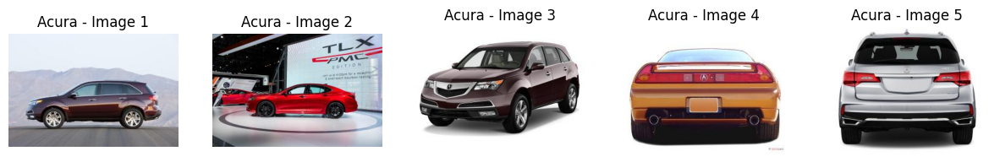

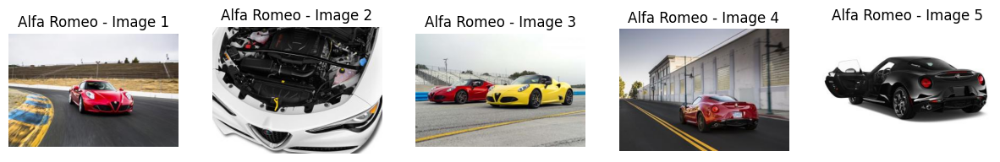

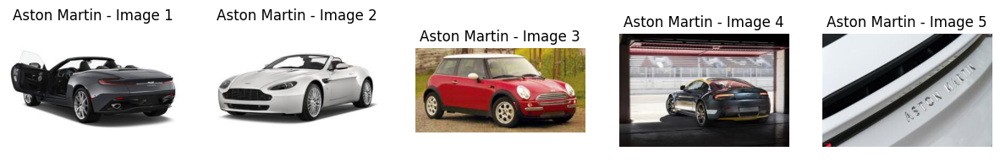

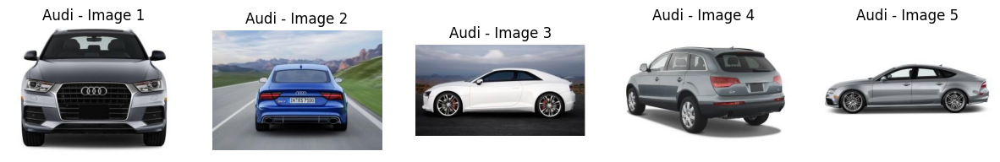

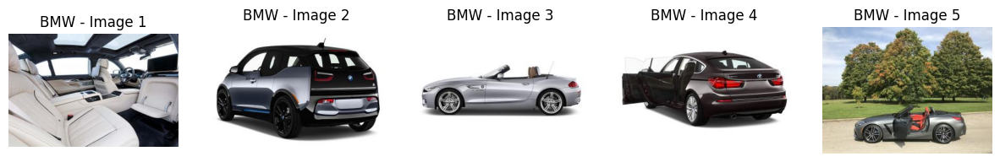

...

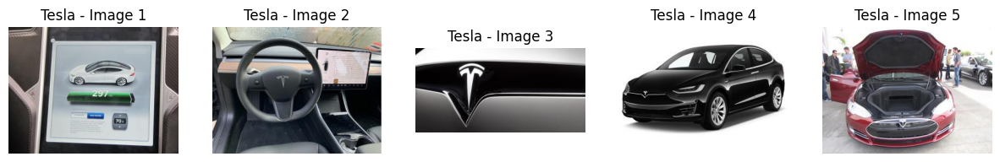

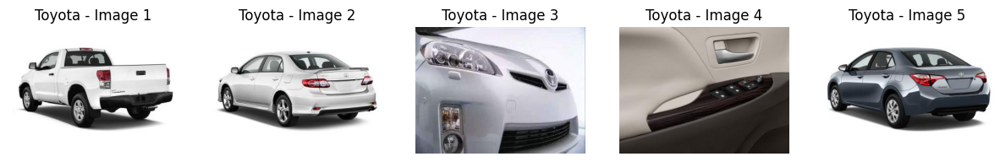

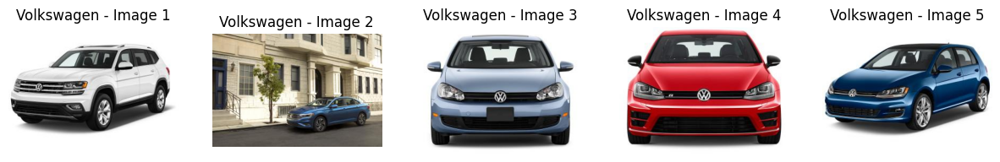

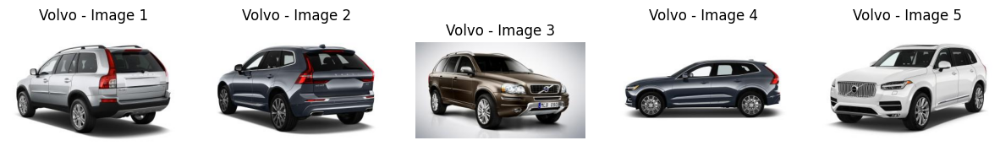

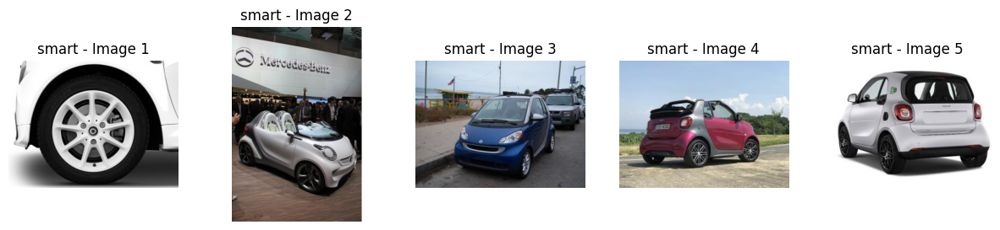

In [20]:
from PIL import Image
import matplotlib.pyplot as plt

grouped = data.groupby('Brand_name')

for brand, group_data in grouped:
    plt.figure(figsize=(15, 3))

    num_images = min(5, len(group_data))

    for i in range(num_images):
        image_path = group_data.iloc[i]['Image_path']

        if not os.path.exists(image_path):  # Skip if file doesn't exist
            print(f"Missing image: {image_path}")
            continue

        image = Image.open(image_path)
        plt.subplot(1, 5, i + 1)
        plt.imshow(image)
        plt.title(f'{brand} - Image {i+1}')
        plt.axis('off')

    plt.show()